# Ramp analysis of MIRI Flight Model test observation FM1T00011284
This test was performed in the context of the MRS_RAD_04 series (checking the MRS spectrophotometric performance).

In [10]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [1]:
import funcs
import mrsobs

import numpy as np
from astropy.io import fits
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
plt.style.use('presentation')
%matplotlib notebook

import warnings
warnings.simplefilter('ignore')

In [2]:
workDir  = '/Users/ioannisa/Desktop/python/miri_devel/'
lvl1path = '/Volumes/miri_mrs_data/FM_MRS/'
lvl2path = workDir+'FM_data/LVL2/'
cdpDir   = workDir+'cdp_data/'

**Let's load the LVL1 data**

In [4]:
# Get data
sci_exp_hdu_SW   = fits.open(lvl1path+'FM1T00011284/MIRFM1T00011284_1_495_SE_2011-05-31T04h09m25.fits')
sci_exp_ramp_SW  = (sci_exp_hdu_SW[0].data).astype('float')
sci_exp_slope_SW = fits.open(lvl2path+'FM1T00011284/MIRFM1T00011284_1_495_SE_2011-05-31T04h09m25_LVL2.fits')[0].data[0,:,:]

sci_exp_hdu_LW   = fits.open(lvl1path+'FM1T00011284/MIRFM1T00011284_1_494_SE_2011-05-31T04h08m55.fits')
sci_exp_ramp_LW  = (sci_exp_hdu_LW[0].data).astype('float')
sci_exp_slope_LW = fits.open(lvl2path+'FM1T00011284/MIRFM1T00011284_1_494_SE_2011-05-31T04h08m55_LVL2.fits')[0].data[0,:,:]

# print spectral bands
print 'MIRIFUSHORT:'
print 'DGAA_pos = {}'.format(sci_exp_hdu_SW[0].header['DGAA_POS'])
print 'DGAB_pos = {}'.format(sci_exp_hdu_SW[0].header['DGAB_POS'])
print 'MIRIFULONG:'
print 'DGAA_pos = {}'.format(sci_exp_hdu_LW[0].header['DGAA_POS'])
print 'DGAB_pos = {}'.format(sci_exp_hdu_LW[0].header['DGAB_POS'])

# load new slice map
sliceMaps_hdu = fits.open(cdpDir+'CDP7/MIRI_FM_MIRIFUSHORT_12SHORT_DISTORTION_7B.05.00.fits')['Slice_Number']
sliceMaps = fits.open(cdpDir+'CDP7/MIRI_FM_MIRIFUSHORT_12SHORT_DISTORTION_7B.05.00.fits')['Slice_Number'].data

MIRIFUSHORT:
DGAA_pos = LONG
DGAB_pos = LONG
MIRIFULONG:
DGAA_pos = LONG
DGAB_pos = LONG


### SHORT WAVELENGTH (SCA ID 495) ANALYSIS
**HEADER INFORMATION**

In [5]:
print(repr(sci_exp_hdu_SW[0].header))

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1032                                                  
NAXIS2  =                 1280                                                  
NAXIS3  =                  120 / length of third data axis                      
EXTEND  =                    T                                                  
                                                                                
                                                                                
                                                                                
DATE    = '2011-05-31T04:09:33' / date file created (yyyy-mm-ddThh:mm:ss,UTC)   
BSCALE  =                    1 / scale factor for array value to physical value 
BZERO   =                327

In [6]:
nints = sci_exp_hdu_SW[0].header['NINT']
ngroups = sci_exp_hdu_SW[0].header['NGROUP']
frame_delta_time = sci_exp_hdu_SW[0].header['TFRAME']
print 'LVL1 data shape: {}'.format(sci_exp_ramp_SW.shape)

LVL1 data shape: (120, 1280, 1032)


**Let's show the DHAS-processed LVL2 data.**

<IPython.core.display.Javascript object>


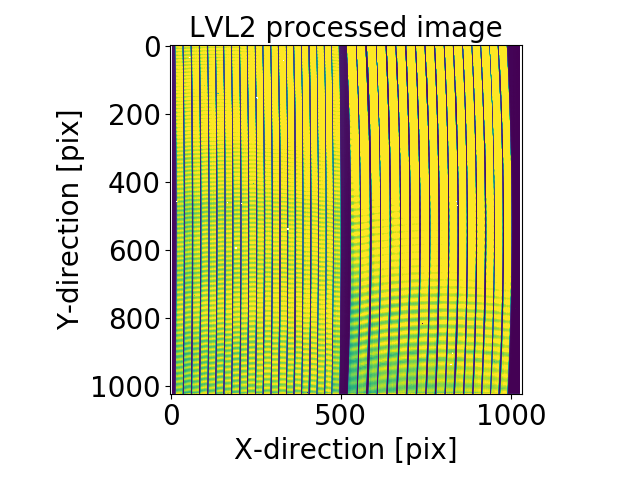

In [7]:
plt.figure()
plt.title('LVL2 processed image')
plt.imshow(sci_exp_slope_SW,vmin=0,vmax=35)
plt.xlabel('X-direction [pix]')
plt.ylabel('Y-direction [pix]')
plt.tight_layout()

**Remarks:**
* There is a four pixel column systematic. The signal of every fourth column is lower than the signal in the in-between pixel columns.
* Pixel columns 56, 168, 193, 256 show some strange (consistent) lower signal values. This is investigated further below.

**Let's look at the integration ramps for this background observation**

<IPython.core.display.Javascript object>


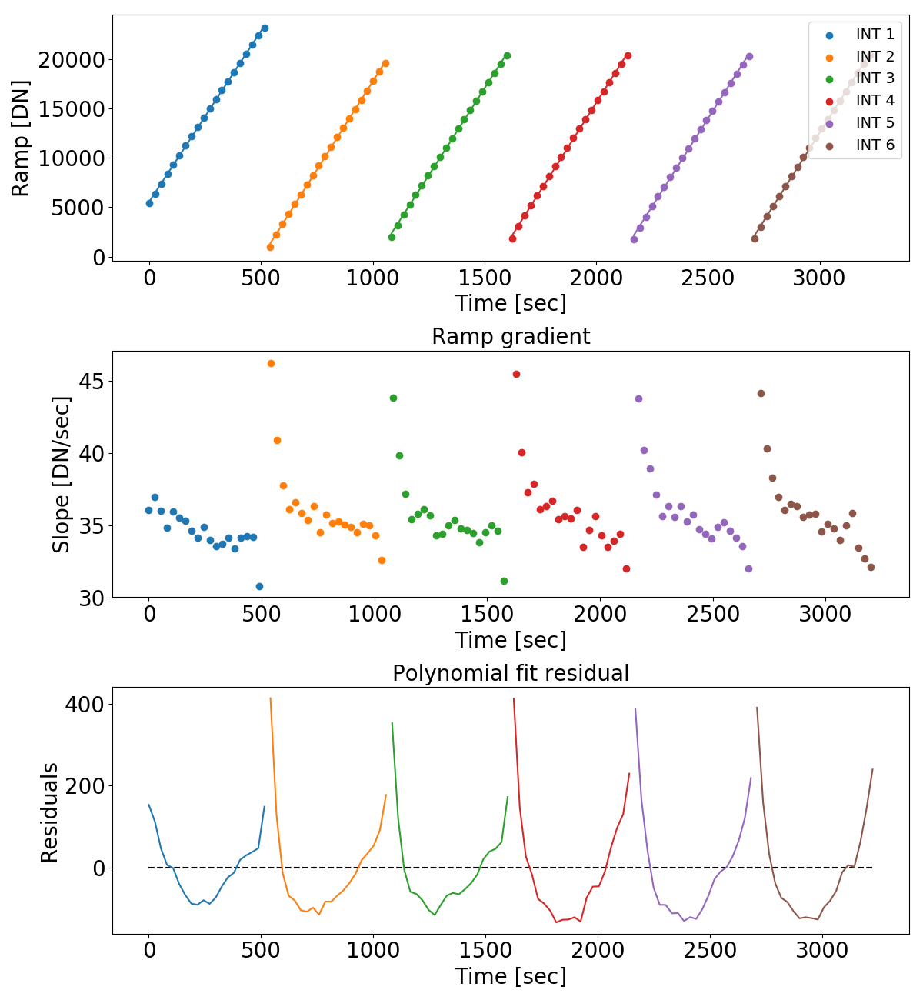

Determined slopes per integration: [34.54, 35.71, 35.22, 35.66, 35.59, 35.67] DN/sec
Determined slopes per integration (excluding first and last frame): [34.53, 35.54, 35.09, 35.53, 35.46, 35.56] DN/sec
DHAS-estimated slope: 33.81 DN/sec


In [71]:
ypos,xpos = 177,27
fig,axs = plt.subplots(3,1,figsize=(12,13))
slopes,slopes_minus_first_and_last_frame = [],[]
for i in range(nints):
    xdata  = np.arange(sci_exp_ramp_SW.shape[0])[i*ngroups:(i+1)*ngroups]*frame_delta_time
    ydata  = sci_exp_ramp_SW[i*ngroups:(i+1)*ngroups,ypos,xpos]
    n_poly = 1
    
    popt = np.polyfit(xdata,ydata,n_poly) # ,w=1/sigma
    popt_minus_first_and_last_frame = np.polyfit(xdata[1:-1],ydata[1:-1],n_poly)
    poly = np.poly1d(popt)
    
    slopes.append(round(popt[0],2))
    slopes_minus_first_and_last_frame.append(round(popt_minus_first_and_last_frame[0],2))
    
    residuals = poly(xdata)-ydata

    axs[0].plot(xdata,poly(xdata))
    axs[0].scatter(xdata,ydata,label='INT {}'.format(i+1))
    axs[0].set_xlabel('Time [sec]')
    axs[0].set_ylabel('Ramp [DN]')
    axs[0].legend(loc='upper right')
    axs[1].set_title('Ramp gradient')
    axs[1].scatter(xdata[:-1],np.diff(ydata)/frame_delta_time)
    axs[1].set_xlabel('Time [sec]')
    axs[1].set_ylabel('Slope [DN/sec]')
    axs[2].plot(xdata,residuals)
    axs[2].set_title('Polynomial fit residual')
    axs[2].set_xlabel('Time [sec]')
    axs[2].set_ylabel('Residuals')
axs[2].hlines(0,0,xdata[-1],linestyle='dashed')
plt.tight_layout()

print 'Determined slopes per integration: {} DN/sec'.format(slopes)
print 'Determined slopes per integration (excluding first and last frame): {} DN/sec'.format(slopes_minus_first_and_last_frame)
print 'DHAS-estimated slope: {} DN/sec'.format(round(sci_exp_slope_SW[ypos,xpos],2))

**Remarks:**
* First and last frame offset clearly apparent
* Why does the slope change between integrations? Is it persistence from a previous observation? DHAS miri_sloper takes an average of all the slopes determined from the separate integrations. However in this case only one slope can be correct (the last one? If it is a settling time problem then this seems like the wisest decision)
* There seem to be wavy patterns in integrations 3, 4, and 5?

10491.5585188


<IPython.core.display.Javascript object>


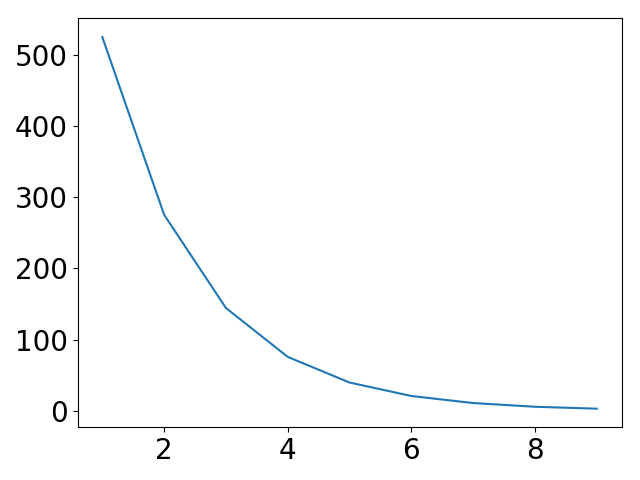

In [70]:
x = np.arange(1,10)
y = 0.05*np.exp(-x/1.55)

print 20000.*np.exp(-1./1.55)

plt.figure()
plt.plot(x,20000.*y)
plt.tight_layout()

**Let's plot some images of frame differences (one frame per group) to-be analyzed further**

<IPython.core.display.Javascript object>


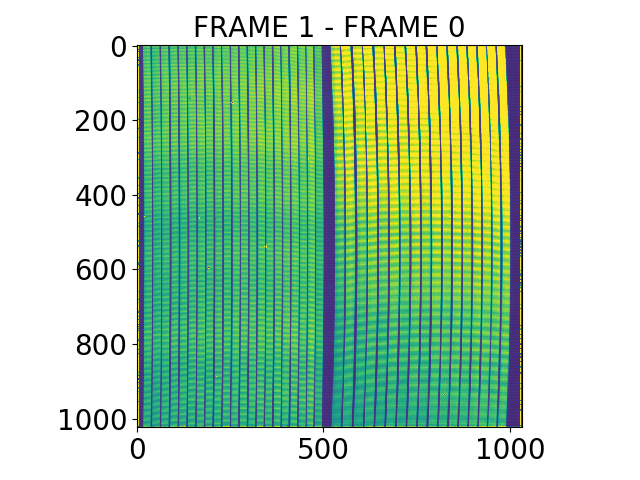

<IPython.core.display.Javascript object>


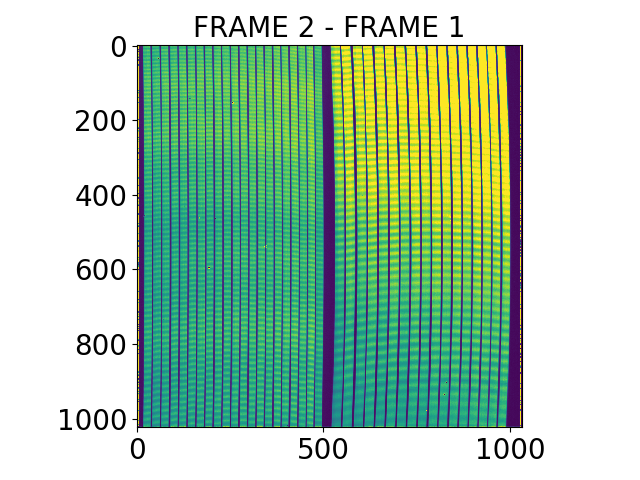

<IPython.core.display.Javascript object>


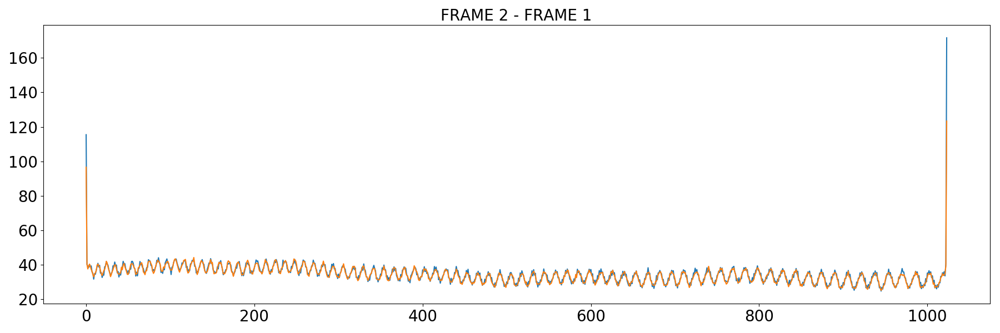

<IPython.core.display.Javascript object>


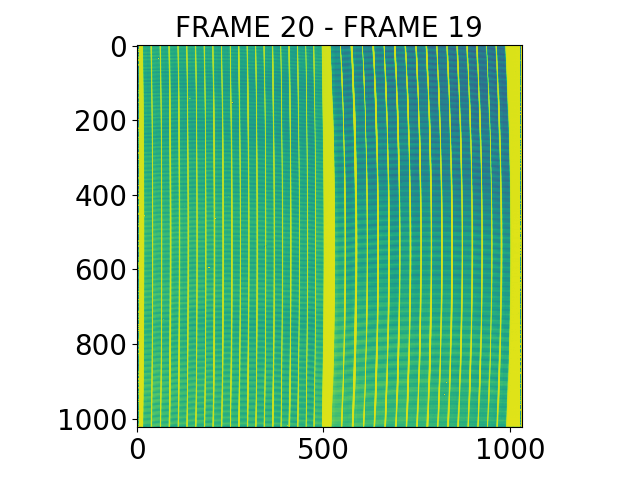

<IPython.core.display.Javascript object>


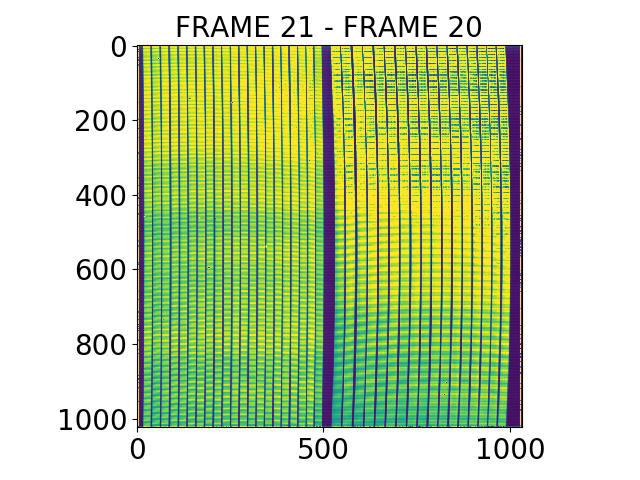

In [61]:
plt.figure()
plt.title('FRAME 1 - FRAME 0')
plt.imshow(sci_exp_ramp_SW[1,:1024,:]-sci_exp_ramp_SW[0,:1024,:],vmax=1500)
plt.tight_layout()

plt.figure()
plt.title('FRAME 2 - FRAME 1')
plt.imshow((sci_exp_ramp_SW[2,:1024,:]-sci_exp_ramp_SW[1,:1024,:])/frame_delta_time,vmax=1500/frame_delta_time)
plt.tight_layout()

plt.figure(figsize=(18,6))
plt.title('FRAME 2 - FRAME 1')
plt.plot((sci_exp_ramp_SW[1,:1024,27]-sci_exp_ramp_SW[0,:1024,27])/frame_delta_time)
plt.plot((sci_exp_ramp_SW[2,:1024,27]-sci_exp_ramp_SW[1,:1024,27])/frame_delta_time)
# plt.plot((sci_exp_ramp_SW[3,:1024,27]-sci_exp_ramp_SW[2,:1024,27])/frame_delta_time)
# plt.plot((sci_exp_ramp_SW[4,:1024,27]-sci_exp_ramp_SW[3,:1024,27])/frame_delta_time)
# plt.plot((sci_exp_ramp_SW[5,:1024,27]-sci_exp_ramp_SW[4,:1024,27])/frame_delta_time)
# plt.plot((sci_exp_ramp_SW[6,:1024,27]-sci_exp_ramp_SW[5,:1024,27])/frame_delta_time)
# plt.plot((sci_exp_ramp_SW[19,:1024,27]-sci_exp_ramp_SW[18,:1024,27])/frame_delta_time,'k--')
plt.tight_layout()

plt.figure()
plt.title('FRAME 20 - FRAME 19')
plt.imshow(sci_exp_ramp_SW[20,:1024,:]-sci_exp_ramp_SW[19,:1024,:])
plt.tight_layout()

plt.figure()
plt.title('FRAME 21 - FRAME 20')
plt.imshow(sci_exp_ramp_SW[21,:1024,:]-sci_exp_ramp_SW[20,:1024,:],vmax=1500)
plt.tight_layout()

**Remarks:**
* Odd/Even effect most visible in difference between the first and the zeroth frame of each integration. There may be a hint of it at the end of the ramp as well, but it's hard to say with certainty whether that is really the case.
* Why are pixel columns 4, 19, 56, 168, 193, 210, 256, 341, 823, 840 so bright w.r.t. their surroundings? This is seen only in the first frame difference plots, of each integration.
* Fringes are clearly visible in the non-first and non-last frame difference plots.
* It is strange that no hint of a "four pixel column" systematic can be found in the LVL1 ramp images, whilst clearly present in the LVL2 processed slope image.

**Let's analyze the above frame difference plots. To do this effectively we plot the difference (pixel) values in histograms. This is done for different detector segments, to probe whether the plotted values have a detector-position dependence.**
* FRAME 1 - FRAME 0, detector segments taken from left to right

In [28]:
def plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=1000):
    # even rows
    arr1_even = img1[::2].flatten().copy()
    arr2_even = img2[::2].flatten().copy()
    arr3_even = img3[::2].flatten().copy()
    arr4_even = img4[::2].flatten().copy()

    arr1_even_hist,binEdges = np.histogram(arr1_even[(arr1_even>lower_lim) & (arr1_even<upper_lim)],bins=nbins,normed=True); arr1_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr2_even_hist,binEdges = np.histogram(arr2_even[(arr2_even>lower_lim) & (arr2_even<upper_lim)],bins=nbins,normed=True); arr2_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr3_even_hist,binEdges = np.histogram(arr3_even[(arr3_even>lower_lim) & (arr3_even<upper_lim)],bins=nbins,normed=True); arr3_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr4_even_hist,binEdges = np.histogram(arr4_even[(arr4_even>lower_lim) & (arr4_even<upper_lim)],bins=nbins,normed=True); arr4_even_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])

    # odd rows
    arr1_odd  = img1[1::2].flatten().copy()
    arr2_odd  = img2[1::2].flatten().copy()
    arr3_odd  = img3[1::2].flatten().copy()
    arr4_odd  = img4[1::2].flatten().copy()

    arr1_odd_hist,binEdges = np.histogram(arr1_odd[(arr1_odd>lower_lim) & (arr1_odd<upper_lim)],bins=nbins,normed=True); arr1_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr2_odd_hist,binEdges = np.histogram(arr2_odd[(arr2_odd>lower_lim) & (arr2_odd<upper_lim)],bins=nbins,normed=True); arr2_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr3_odd_hist,binEdges = np.histogram(arr3_odd[(arr3_odd>lower_lim) & (arr3_odd<upper_lim)],bins=nbins,normed=True); arr3_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    arr4_odd_hist,binEdges = np.histogram(arr4_odd[(arr4_odd>lower_lim) & (arr4_odd<upper_lim)],bins=nbins,normed=True); arr4_odd_bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    
    if rows == 'even':
        return arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters
    elif rows == 'odd':
        return arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters

<IPython.core.display.Javascript object>


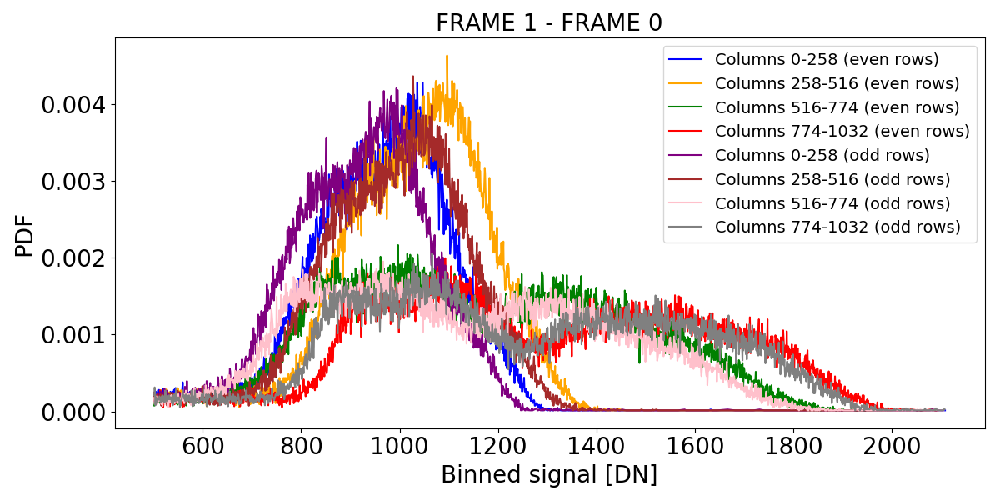

In [33]:
# frame difference images
img1 = sci_exp_ramp_SW[1,:1024,:258]-sci_exp_ramp_SW[0,:1024,:258]
img2 = sci_exp_ramp_SW[1,:1024,258:516]-sci_exp_ramp_SW[0,:1024,258:516]
img3 = sci_exp_ramp_SW[1,:1024,516:774]-sci_exp_ramp_SW[0,:1024,516:774]
img4 = sci_exp_ramp_SW[1,:1024,774:]-sci_exp_ramp_SW[0,:1024,774:]

# histogram limits
lower_lim = 500.
upper_lim = 2110

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=2000)
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd',nbins=2000)

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 1 - FRAME 0')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* There is a difference in binned signal depending on whether one looks at odd or even rows. This is visible as two distinct/resolved peaks of similar amplitude.
* Moving right-ward on the detector makes the signal profiles more assymetric.
* The right-most detector segment yields a peculiar shift in odd-row-related binned signal.

* FRAME 2 - FRAME 1, detector segments taken from left to right

<IPython.core.display.Javascript object>


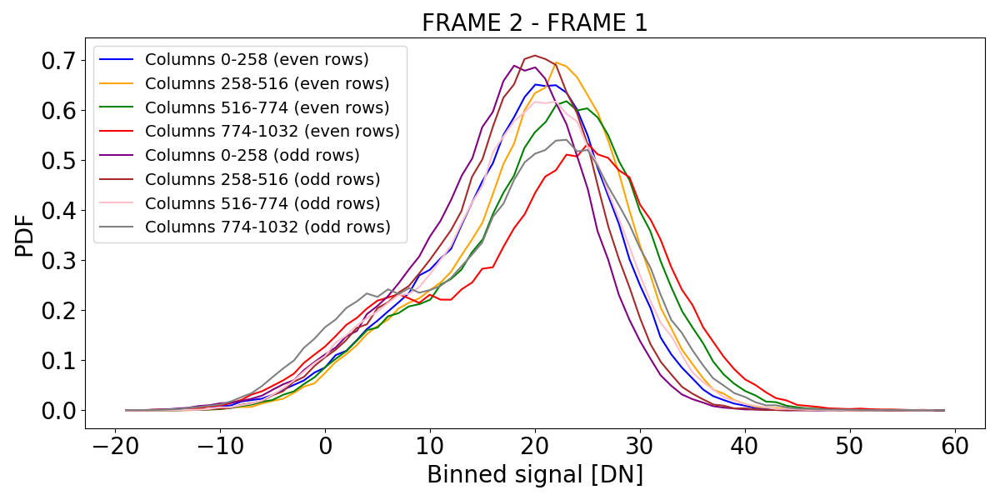

In [92]:
# frame difference images
img1 = bkg_exp_ramp_SW[2,:1024,:258]-bkg_exp_ramp_SW[1,:1024,:258]
img2 = bkg_exp_ramp_SW[2,:1024,258:516]-bkg_exp_ramp_SW[1,:1024,258:516]
img3 = bkg_exp_ramp_SW[2,:1024,516:774]-bkg_exp_ramp_SW[1,:1024,516:774]
img4 = bkg_exp_ramp_SW[2,:1024,774:]-bkg_exp_ramp_SW[1,:1024,774:]

# histogram limits
lower_lim = -20.
upper_lim = 60.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 2 - FRAME 1')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* There are two prominent features in the above plot.
* For the feature on the right, there is not much of a difference in binned signal depending on whether one looks at odd or even rows. There appears to be no difference in binned signal for the lower-amplitude feature on the left as a function of plotted odd or even rows.
* The shape of the feature on the left is admittedly quite strange (non-Gaussian, or a Gaussian that had a bite taken out of it).
* Looking at the high-amplitude right feature, there seems to be a dependence of the binned signal with detector position. Moving right-ward on the detector moves the binned signal to the right. Additionally the overall profile becomes less and less symmetric.
* There is no dependence on detector position for the feature on the left.

* FRAME 20 - FRAME 19, detector segments taken from left to right

<IPython.core.display.Javascript object>


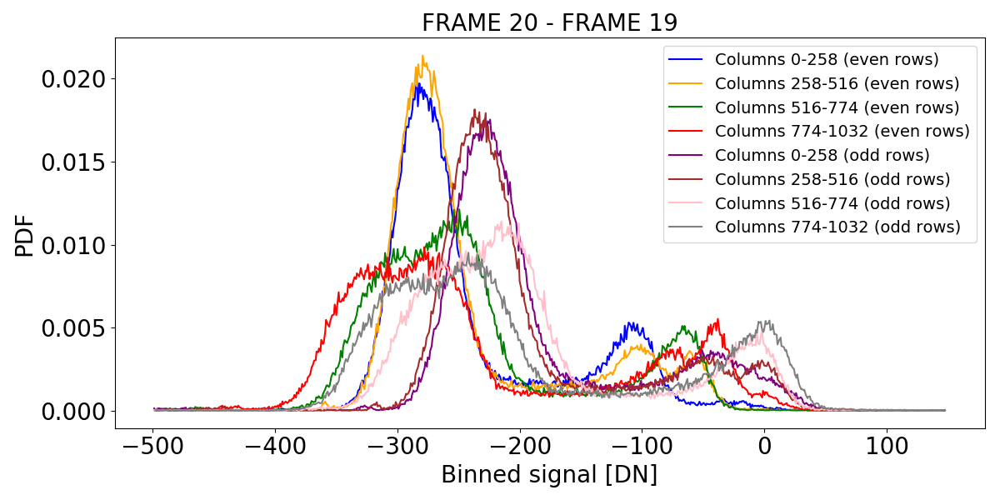

In [93]:
# frame difference images
img1 = bkg_exp_ramp_SW[20,:,:258]-bkg_exp_ramp_SW[19,:,:258]
img2 = bkg_exp_ramp_SW[20,:,258:516]-bkg_exp_ramp_SW[19,:,258:516]
img3 = bkg_exp_ramp_SW[20,:,516:774]-bkg_exp_ramp_SW[19,:,516:774]
img4 = bkg_exp_ramp_SW[20,:,774:]-bkg_exp_ramp_SW[19,:,774:]

# histogram limits
lower_lim = -500.
upper_lim = 150

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 20 - FRAME 19')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* There is a difference between odd and even rows.
* There is a difference in binnned signal profiles between the left and right side of the detector (this has to be a wavelength-dependent difference, since the two halves of the detector observed different wavelength bands).

* FRAME 21 - FRAME 20, detector segments taken from left to right

<IPython.core.display.Javascript object>


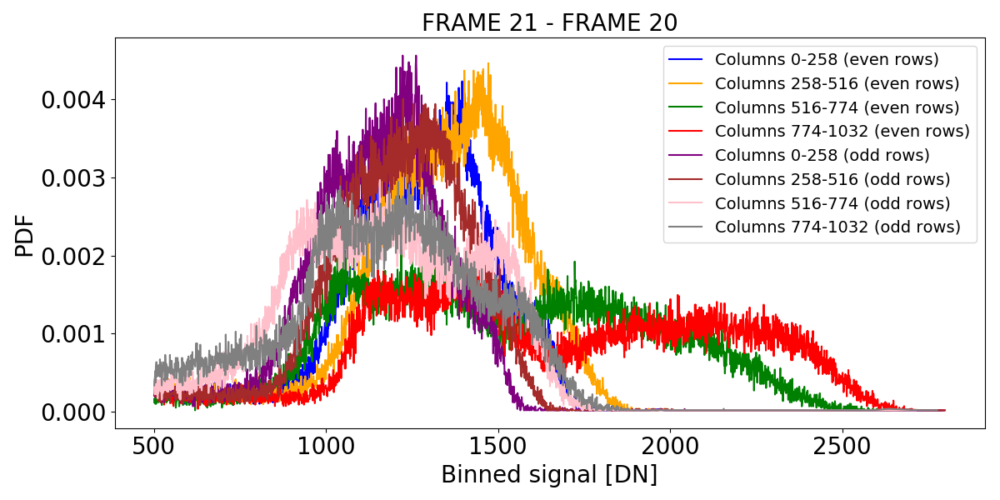

In [38]:
# frame difference images
img1 = sci_exp_ramp_SW[21,:,:258]-sci_exp_ramp_SW[20,:,:258]
img2 = sci_exp_ramp_SW[21,:,258:516]-sci_exp_ramp_SW[20,:,258:516]
img3 = sci_exp_ramp_SW[21,:,516:774]-sci_exp_ramp_SW[20,:,516:774]
img4 = sci_exp_ramp_SW[21,:,774:]-sci_exp_ramp_SW[20,:,774:]

# histogram limits
lower_lim = 500
upper_lim = 2800

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=4000)
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd',nbins=4000)

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 21 - FRAME 20')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

### Remarks:
* There doesn't appear to be a consistent systematic in the above plot.
* There is a clear difference between the odd and even row signal values.

* FRAME 22 - FRAME 21, detector segments taken from left to right

<IPython.core.display.Javascript object>


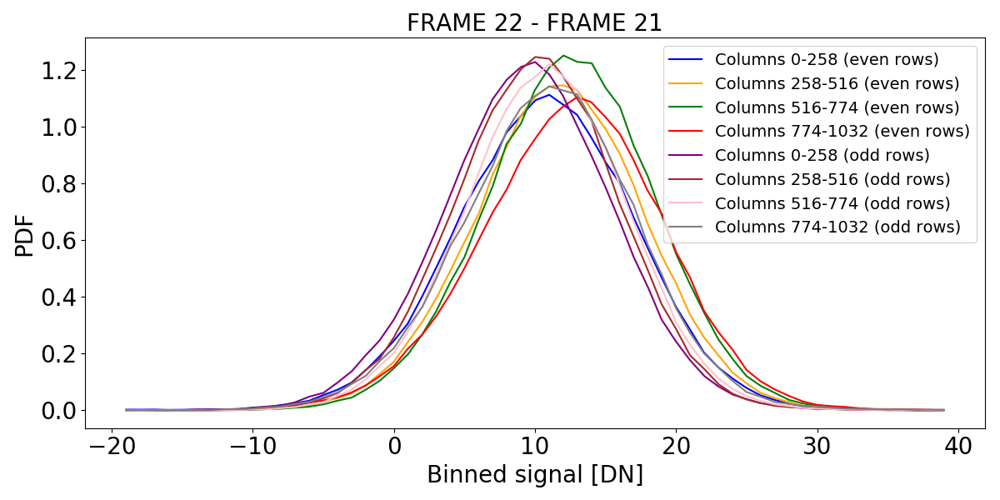

In [95]:
# frame difference images
img1 = bkg_exp_ramp_SW[22,:,:258]-bkg_exp_ramp_SW[21,:,:258]
img2 = bkg_exp_ramp_SW[22,:,258:516]-bkg_exp_ramp_SW[21,:,258:516]
img3 = bkg_exp_ramp_SW[22,:,516:774]-bkg_exp_ramp_SW[21,:,516:774]
img4 = bkg_exp_ramp_SW[22,:,774:]-bkg_exp_ramp_SW[21,:,774:]

# histogram limits
lower_lim = -20.
upper_lim = 40.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 22 - FRAME 21')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* Moving on the detector has a small(?) effect on the position of the signal profile.

* FRAME 1 - FRAME 0, detector upper to lower side

<IPython.core.display.Javascript object>


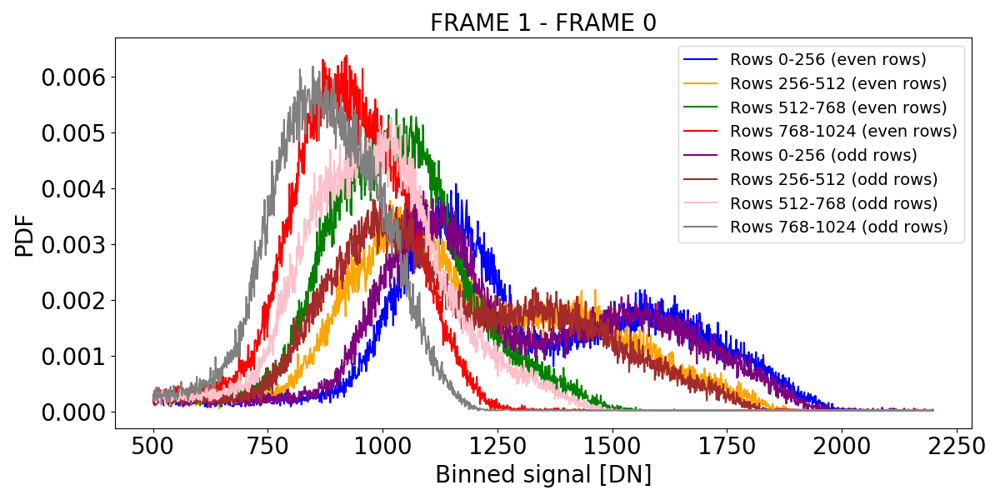

In [45]:
# frame difference images
img1 = sci_exp_ramp_SW[1,:256,:]-sci_exp_ramp_SW[0,:256,:]
img2 = sci_exp_ramp_SW[1,256:512,:]-sci_exp_ramp_SW[0,256:512,:]
img3 = sci_exp_ramp_SW[1,512:768,:]-sci_exp_ramp_SW[0,512:768,:]
img4 = sci_exp_ramp_SW[1,768:1024,:]-sci_exp_ramp_SW[0,768:1024,:]

# histogram limits
lower_lim = 500
upper_lim = 2200

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=3000)
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd',nbins=3000)

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 1 - FRAME 0')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* All arrays have an asymetric signal profile (as we've seen, the asymetric part comes from the right-most segment of the detector)
* There is a clear difference between the odd and even row arrays.

* FRAME 2 - FRAME 1, detector upper to lower side

<IPython.core.display.Javascript object>


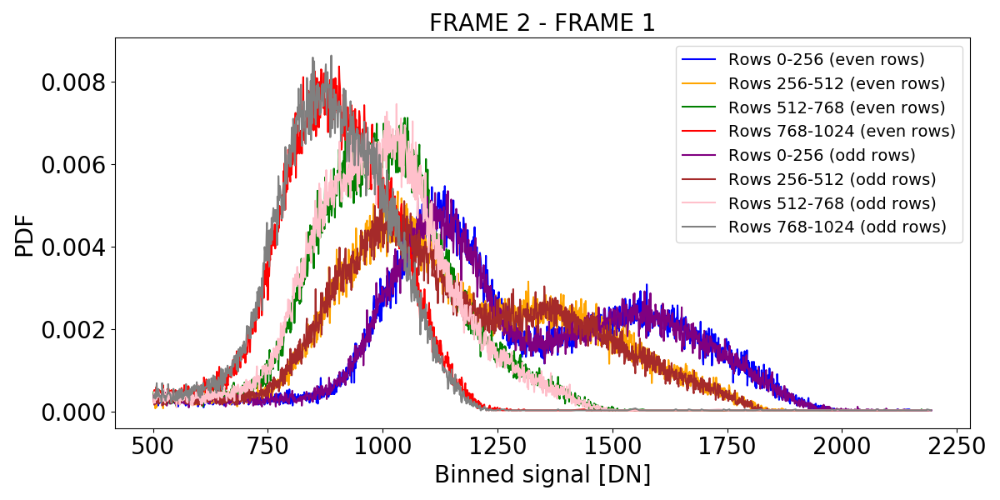

In [31]:
# frame difference images
img1 = sci_exp_ramp_SW[2,:256,:]-sci_exp_ramp_SW[1,:256,:]
img2 = sci_exp_ramp_SW[2,256:512,:]-sci_exp_ramp_SW[1,256:512,:]
img3 = sci_exp_ramp_SW[2,512:768,:]-sci_exp_ramp_SW[1,512:768,:]
img4 = sci_exp_ramp_SW[2,768:1024,:]-sci_exp_ramp_SW[1,768:1024,:]

# histogram limits
lower_lim = 500.
upper_lim = 2200

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=4000)
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd',nbins=4000)

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 2 - FRAME 1')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* There appears to be a left-ward movement when moving down on the detector. This signifies a wavelength-dependent systematic.
* The difference in binned signal between odd and even rows is small, but still present.

* FRAME 20 - FRAME 19, detector upper to lower side

<IPython.core.display.Javascript object>


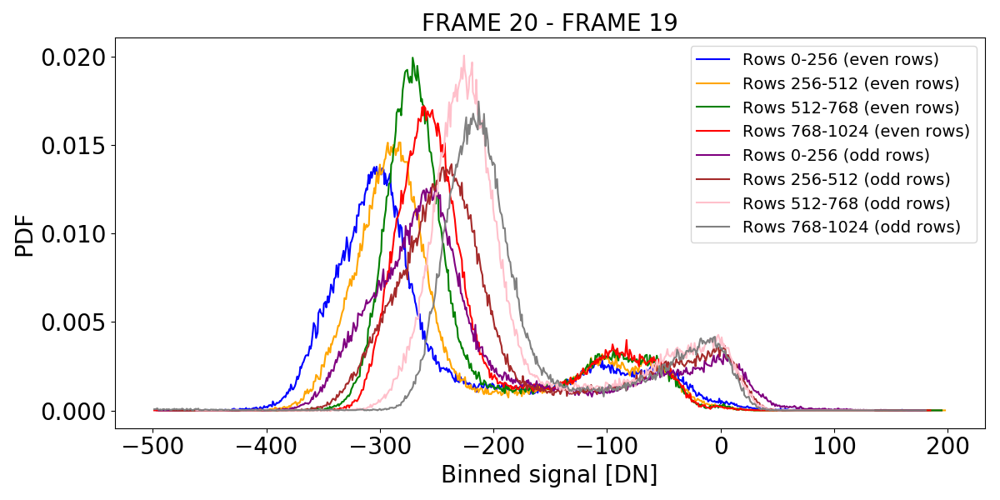

In [97]:
# frame difference images
img1 = bkg_exp_ramp_SW[20,:256,:]-bkg_exp_ramp_SW[19,:256,:]
img2 = bkg_exp_ramp_SW[20,256:512,:]-bkg_exp_ramp_SW[19,256:512,:]
img3 = bkg_exp_ramp_SW[20,512:768,:]-bkg_exp_ramp_SW[19,512:768,:]
img4 = bkg_exp_ramp_SW[20,768:1024,:]-bkg_exp_ramp_SW[19,768:1024,:]

# histogram limits
lower_lim = -500.
upper_lim = 200.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 20 - FRAME 19')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* Similar remarks as per the FRAME 20 - FRAME 19 (left to right of detector) exercise.

* FRAME 21 - FRAME 20, detector upper to lower side

<IPython.core.display.Javascript object>


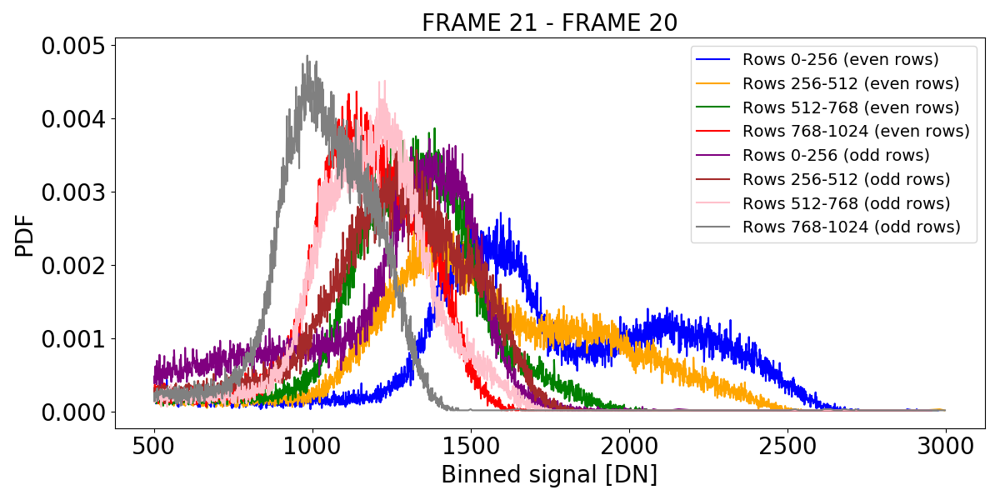

In [42]:
# frame difference images
img1 = sci_exp_ramp_SW[21,:256,:]-sci_exp_ramp_SW[20,:256,:]
img2 = sci_exp_ramp_SW[21,256:512,:]-sci_exp_ramp_SW[20,256:512,:]
img3 = sci_exp_ramp_SW[21,512:768,:]-sci_exp_ramp_SW[20,512:768,:]
img4 = sci_exp_ramp_SW[21,768:1024,:]-sci_exp_ramp_SW[20,768:1024,:]

# histogram limits
lower_lim = 500
upper_lim = 3000

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even',nbins=4000)
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd',nbins=4000)

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 21 - FRAME 20')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

### Remarks:
* Contrary to the GROUP 1 - GROUP 0 calculation the signal profile seems to be symmetric (?)
* There is still a wavelength dependence present in the data.

* FRAME 22 - FRAME 21, detector upper to lower side

<IPython.core.display.Javascript object>


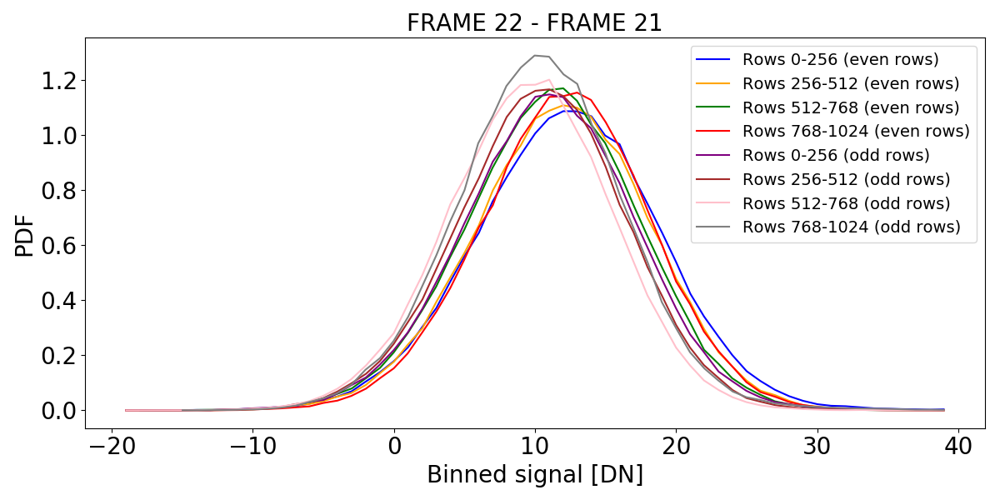

In [99]:
# frame difference images
img1 = bkg_exp_ramp_SW[22,:256,:]-bkg_exp_ramp_SW[21,:256,:]
img2 = bkg_exp_ramp_SW[22,256:512,:]-bkg_exp_ramp_SW[21,256:512,:]
img3 = bkg_exp_ramp_SW[22,512:768,:]-bkg_exp_ramp_SW[21,512:768,:]
img4 = bkg_exp_ramp_SW[22,768:1024,:]-bkg_exp_ramp_SW[21,768:1024,:]

# histogram limits
lower_lim = -20.
upper_lim = 40.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 22 - FRAME 21')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* The discrepancy between the odd and even rows is extremely small.
* Additionally the signal profile seems to be independent of the detector segment / wavelength range (?) This doesn't match the conclusion adopted in the FRAME 21 - FRAME 20 calculation, nor in the FRAME 2 - FRAME 1 calculation.

* FRAME 23 - FRAME 22, detector upper to lower side

<IPython.core.display.Javascript object>


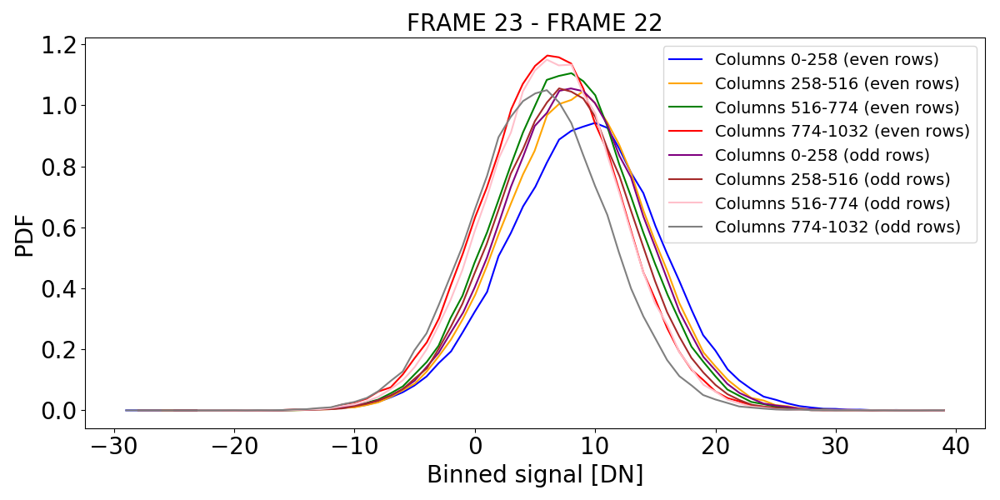

In [100]:
# frame difference images
img1 = bkg_exp_ramp_SW[23,:256,:]-bkg_exp_ramp_SW[22,:256,:]
img2 = bkg_exp_ramp_SW[23,256:512,:]-bkg_exp_ramp_SW[22,256:512,:]
img3 = bkg_exp_ramp_SW[23,512:768,:]-bkg_exp_ramp_SW[22,512:768,:]
img4 = bkg_exp_ramp_SW[23,768:1024,:]-bkg_exp_ramp_SW[22,768:1024,:]

# histogram limits
lower_lim = -30.
upper_lim = 40.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 23 - FRAME 22')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper right')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

**Remarks:**
* Same conclusions as per the FRAME 22 - FRAME 21 calculation.

### LONG WAVELENGTH (SCA ID 494) ANALYSIS
**HEADER INFORMATION**

In [57]:
print(repr(bkg_exp_hdu_LW[0].header))

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 1032                                                  
NAXIS2  =                 1280                                                  
NAXIS3  =                  120 / length of third data axis                      
EXTEND  =                    T                                                  
                                                                                
                                                                                
                                                                                
DATE    = '2011-05-31T05:06:25' / date file created (yyyy-mm-ddThh:mm:ss,UTC)   
BSCALE  =                    1 / scale factor for array value to physical value 
BZERO   =                327

In [59]:
nints = bkg_exp_hdu_LW[0].header['NINT']
ngroups = bkg_exp_hdu_LW[0].header['NGROUP']
frame_delta_time = bkg_exp_hdu_LW[0].header['TFRAME']
print 'LVL1 data shape: {}'.format(bkg_exp_ramp_LW.shape)

LVL1 data shape: (120, 1280, 1032)


**Let's show the DHAS-processed LVL2 data.**

<IPython.core.display.Javascript object>


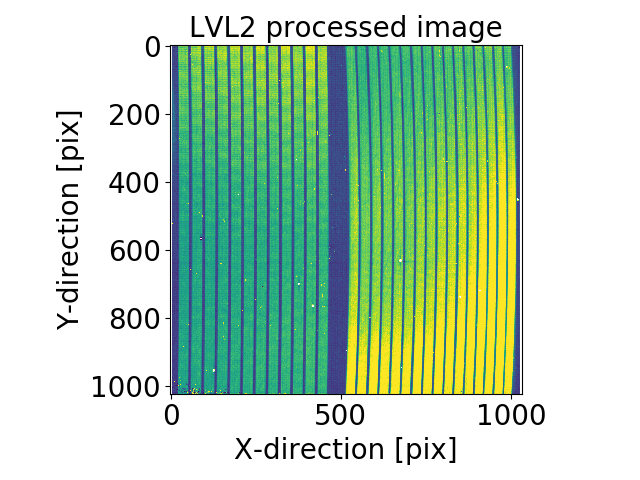

In [60]:
plt.figure()
plt.title('LVL2 processed image')
plt.imshow(bkg_exp_slope_LW,vmin=0,vmax=0.15)
plt.xlabel('X-direction [pix]')
plt.ylabel('Y-direction [pix]')
plt.tight_layout()

**No remarks.**

**Let's look at the integration ramps for this background observation**

<IPython.core.display.Javascript object>


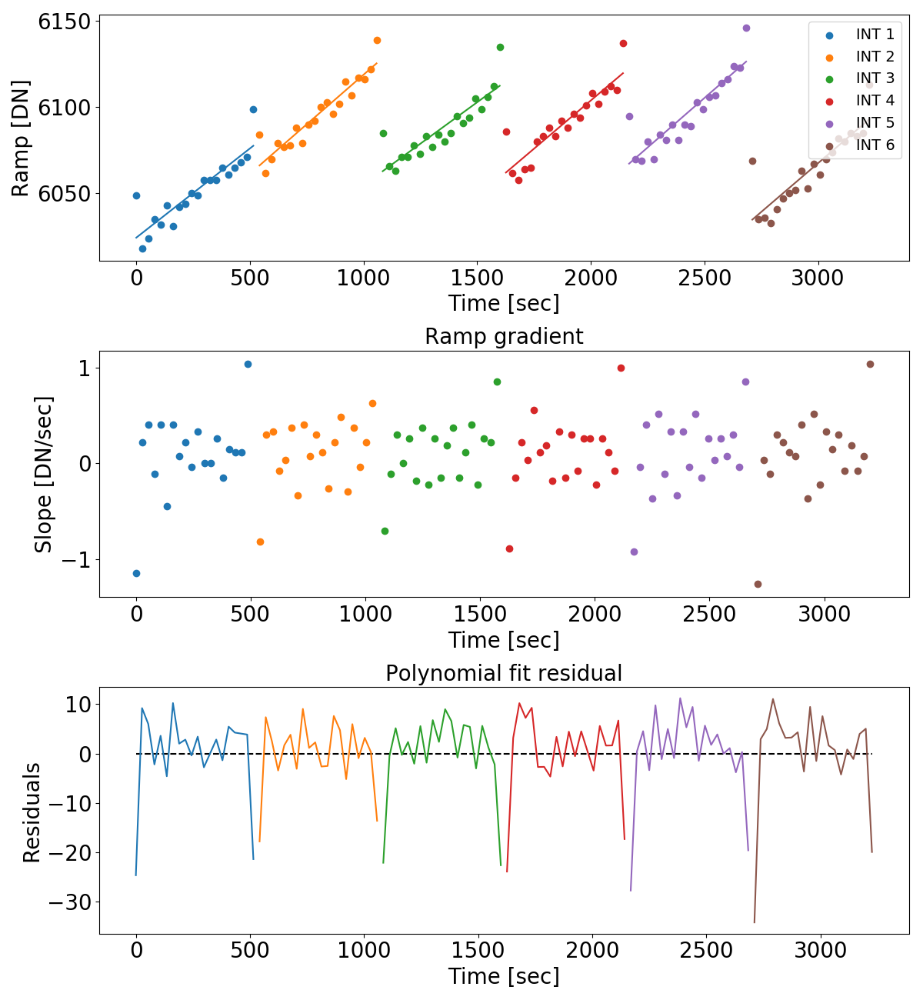

Determined slopes per integration: [0.1, 0.11, 0.1, 0.11, 0.11, 0.11] DN/sec
Determined slopes per integration (excluding first and last frame): [0.11, 0.12, 0.1, 0.12, 0.12, 0.12] DN/sec
DHAS-estimated slope: 0.11 DN/sec


In [67]:
ypos,xpos = 177,32
fig,axs = plt.subplots(3,1,figsize=(12,13))
slopes,slopes_minus_first_and_last_frame = [],[]
for i in range(nints):
    xdata  = np.arange(bkg_exp_ramp_LW.shape[0])[i*ngroups:(i+1)*ngroups]*frame_delta_time
    ydata  = bkg_exp_ramp_LW[i*ngroups:(i+1)*ngroups,ypos,xpos]
    n_poly = 1
    
    popt = np.polyfit(xdata,ydata,n_poly) # ,w=1/sigma
    popt_minus_first_and_last_frame = np.polyfit(xdata[1:-1],ydata[1:-1],n_poly)
    poly = np.poly1d(popt)
    
    slopes.append(round(popt[0],2))
    slopes_minus_first_and_last_frame.append(round(popt_minus_first_and_last_frame[0],2))
    
    residuals = poly(xdata)-ydata

    axs[0].plot(xdata,poly(xdata))
    axs[0].scatter(xdata,ydata,label='INT {}'.format(i+1))
    axs[0].set_xlabel('Time [sec]')
    axs[0].set_ylabel('Ramp [DN]')
    axs[0].legend(loc='upper right')
    axs[1].set_title('Ramp gradient')
    axs[1].scatter(xdata[:-1],np.diff(ydata)/frame_delta_time)
    axs[1].set_xlabel('Time [sec]')
    axs[1].set_ylabel('Slope [DN/sec]')
    axs[2].plot(xdata,residuals)
    axs[2].set_title('Polynomial fit residual')
    axs[2].set_xlabel('Time [sec]')
    axs[2].set_ylabel('Residuals')
axs[2].hlines(0,0,xdata[-1],linestyle='dashed')
plt.tight_layout()

print 'Determined slopes per integration: {} DN/sec'.format(slopes)
print 'Determined slopes per integration (excluding first and last frame): {} DN/sec'.format(slopes_minus_first_and_last_frame)
print 'DHAS-estimated slope: {} DN/sec'.format(round(bkg_exp_slope_LW[ypos,xpos],2))

**No remarks.**

<IPython.core.display.Javascript object>


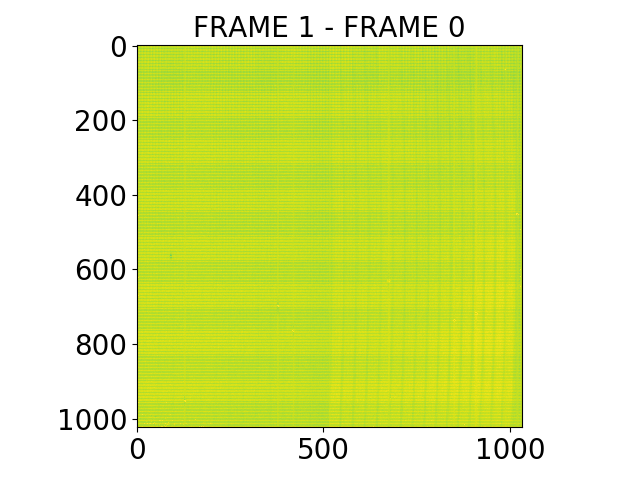

<IPython.core.display.Javascript object>


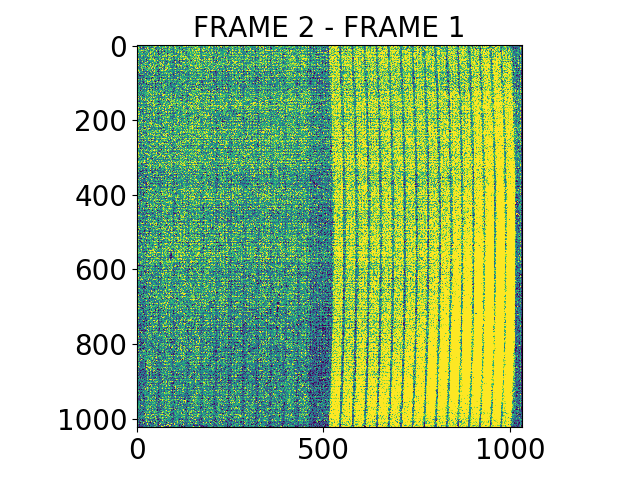

<IPython.core.display.Javascript object>


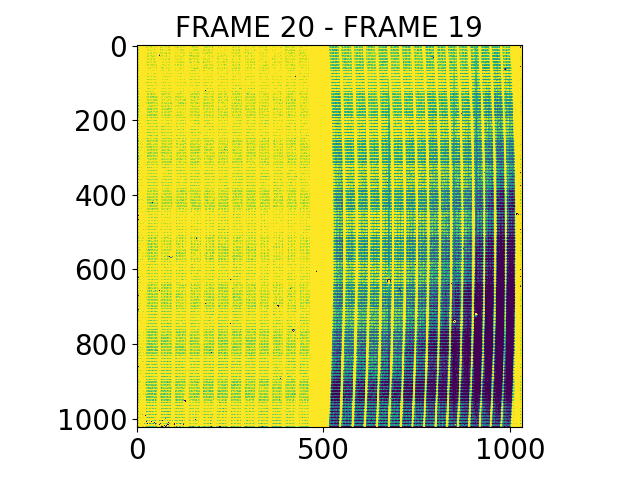

<IPython.core.display.Javascript object>


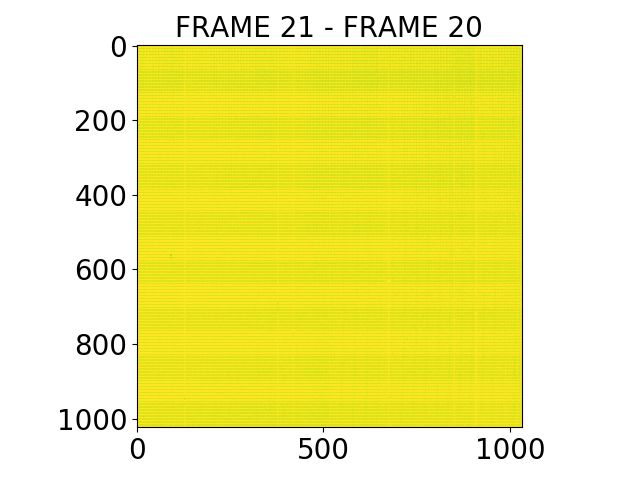

In [79]:
plt.figure()
plt.title('FRAME 1 - FRAME 0')
plt.imshow(bkg_exp_ramp_LW[1,:1024,:]-bkg_exp_ramp_LW[0,:1024,:],vmax=80)
plt.tight_layout()

plt.figure()
plt.title('FRAME 2 - FRAME 1')
plt.imshow(bkg_exp_ramp_LW[2,:1024,:]-bkg_exp_ramp_LW[1,:1024,:],vmin=-5,vmax=20)
plt.tight_layout()

plt.figure()
plt.title('FRAME 20 - FRAME 19')
plt.imshow(bkg_exp_ramp_LW[20,:1024,:]-bkg_exp_ramp_LW[19,:1024,:],vmin=-300,vmax=-100)
plt.tight_layout()

plt.figure()
plt.title('FRAME 21 - FRAME 20')
plt.imshow(bkg_exp_ramp_LW[21,:1024,:]-bkg_exp_ramp_LW[20,:1024,:],vmax=10)
plt.tight_layout()

**Remarks:**
* There are bright columns in places with bad pixels (see FRAME 21-FRAME 20 pixel columns 127,377,419,517(?),675,850,908). Why doesn't the brightness also show up as a horizontal line?..
* There is a clear odd/even row offset in the first frame difference plots, of every integration.

**Let's analyze the above frame difference plots. To do this effectively we plot the difference (pixel) values in histograms. This is done for different detector segments, to probe whether the plotted values have a detector-position dependence.**
* FRAME 1 - FRAME 0, detector segments taken from left to right

<IPython.core.display.Javascript object>


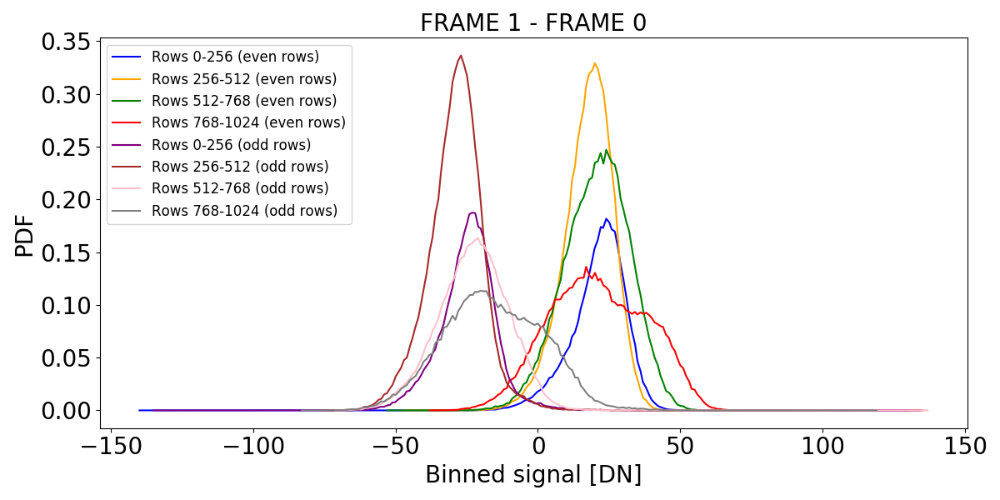

In [116]:
# frame difference images
img1 = bkg_exp_ramp_LW[1,:1024,:258]-bkg_exp_ramp_LW[0,:1024,:258]
img2 = bkg_exp_ramp_LW[1,:1024,258:516]-bkg_exp_ramp_LW[0,:1024,258:516]
img3 = bkg_exp_ramp_LW[1,:1024,516:774]-bkg_exp_ramp_LW[0,:1024,516:774]
img4 = bkg_exp_ramp_LW[1,:1024,774:]-bkg_exp_ramp_LW[0,:1024,774:]

# histogram limits
lower_lim = -150.
upper_lim = 150.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 1 - FRAME 0')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

* FRAME 2 - FRAME 1, detector segments taken from left to right

<IPython.core.display.Javascript object>


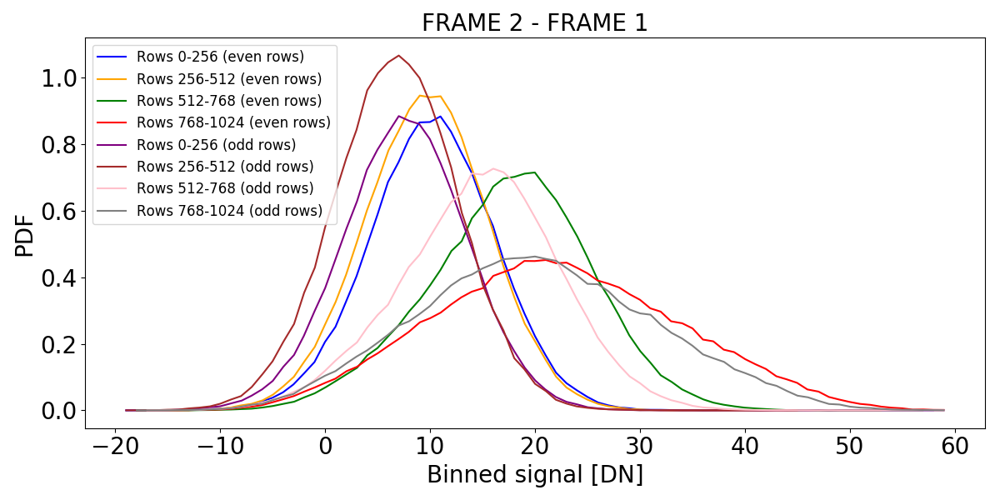

In [115]:
# frame difference images
img1 = bkg_exp_ramp_LW[2,:1024,:258]-bkg_exp_ramp_LW[1,:1024,:258]
img2 = bkg_exp_ramp_LW[2,:1024,258:516]-bkg_exp_ramp_LW[1,:1024,258:516]
img3 = bkg_exp_ramp_LW[2,:1024,516:774]-bkg_exp_ramp_LW[1,:1024,516:774]
img4 = bkg_exp_ramp_LW[2,:1024,774:]-bkg_exp_ramp_LW[1,:1024,774:]

# histogram limits
lower_lim = -20.
upper_lim = 60.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 2 - FRAME 1')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

* FRAME 20 - FRAME 19, detector segments taken from left to right

<IPython.core.display.Javascript object>


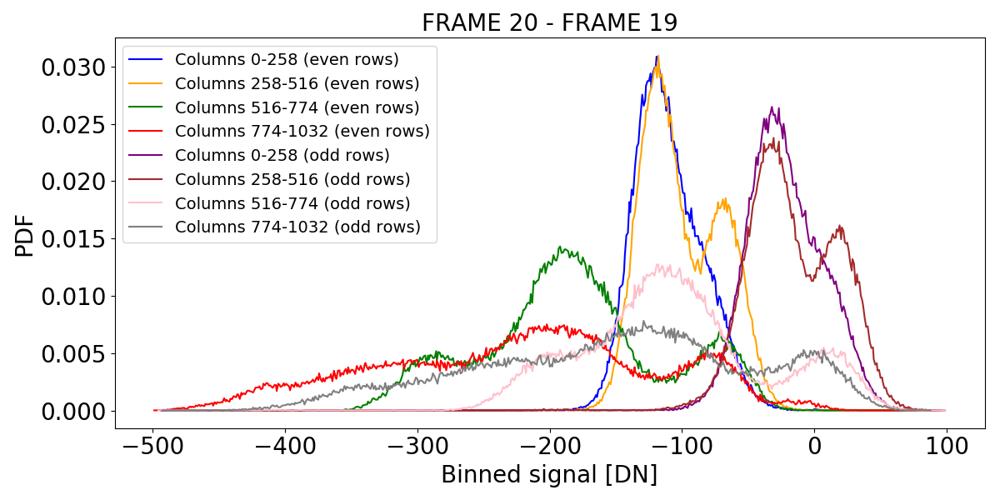

In [107]:
# frame difference images
img1 = bkg_exp_ramp_LW[20,:1024,:258]-bkg_exp_ramp_LW[19,:1024,:258]
img2 = bkg_exp_ramp_LW[20,:1024,258:516]-bkg_exp_ramp_LW[19,:1024,258:516]
img3 = bkg_exp_ramp_LW[20,:1024,516:774]-bkg_exp_ramp_LW[19,:1024,516:774]
img4 = bkg_exp_ramp_LW[20,:1024,774:]-bkg_exp_ramp_LW[19,:1024,774:]

# histogram limits
lower_lim = -500
upper_lim = 100

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 20 - FRAME 19')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

* FRAME 21 - FRAME 20, detector segments taken from left to right

<IPython.core.display.Javascript object>


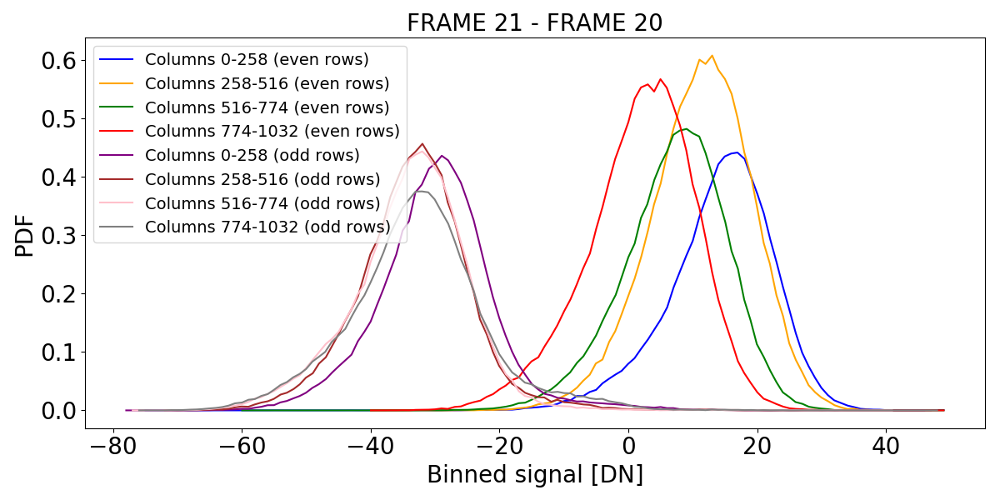

In [110]:
# frame difference images
img1 = bkg_exp_ramp_LW[21,:1024,:258]-bkg_exp_ramp_LW[20,:1024,:258]
img2 = bkg_exp_ramp_LW[21,:1024,258:516]-bkg_exp_ramp_LW[20,:1024,258:516]
img3 = bkg_exp_ramp_LW[21,:1024,516:774]-bkg_exp_ramp_LW[20,:1024,516:774]
img4 = bkg_exp_ramp_LW[21,:1024,774:]-bkg_exp_ramp_LW[20,:1024,774:]

# histogram limits
lower_lim = -80.
upper_lim = 50.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 21 - FRAME 20')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

* FRAME 22 - FRAME 21, detector segments taken from left to right

<IPython.core.display.Javascript object>


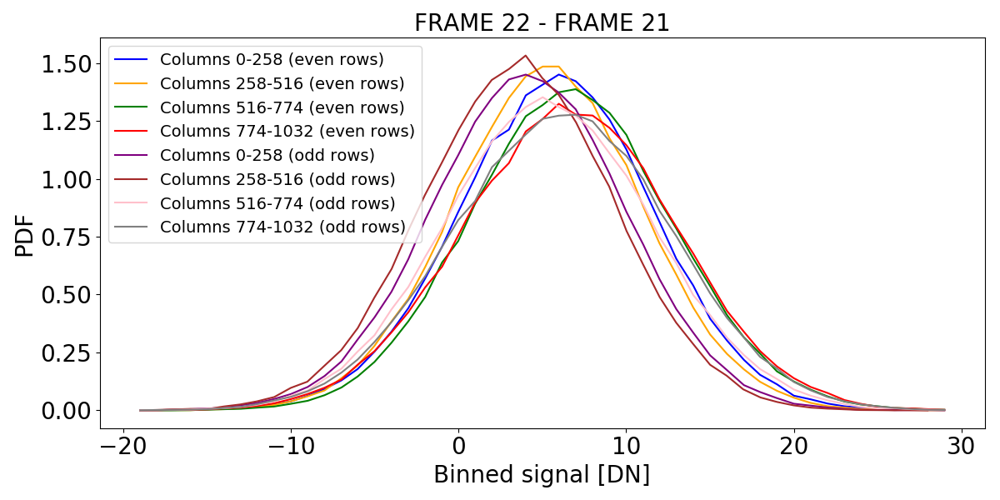

In [112]:
# frame difference images
img1 = bkg_exp_ramp_LW[22,:1024,:258]-bkg_exp_ramp_LW[21,:1024,:258]
img2 = bkg_exp_ramp_LW[22,:1024,258:516]-bkg_exp_ramp_LW[21,:1024,258:516]
img3 = bkg_exp_ramp_LW[22,:1024,516:774]-bkg_exp_ramp_LW[21,:1024,516:774]
img4 = bkg_exp_ramp_LW[22,:1024,774:]-bkg_exp_ramp_LW[21,:1024,774:]

# histogram limits
lower_lim = -20.
upper_lim = 30.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 22 - FRAME 21')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

* FRAME 23 - FRAME 22, detector segments taken from left to right

<IPython.core.display.Javascript object>


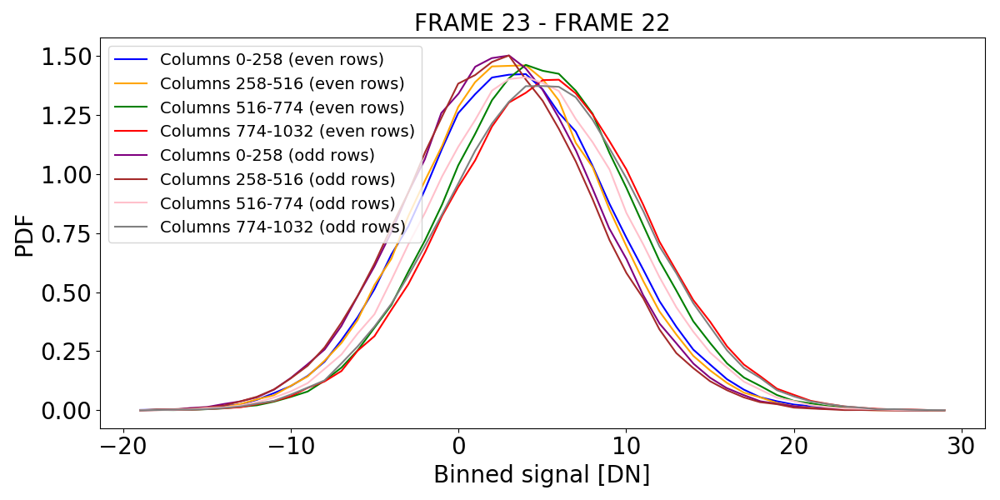

In [117]:
# frame difference images
img1 = bkg_exp_ramp_LW[23,:1024,:258]-bkg_exp_ramp_LW[22,:1024,:258]
img2 = bkg_exp_ramp_LW[23,:1024,258:516]-bkg_exp_ramp_LW[22,:1024,258:516]
img3 = bkg_exp_ramp_LW[23,:1024,516:774]-bkg_exp_ramp_LW[22,:1024,516:774]
img4 = bkg_exp_ramp_LW[23,:1024,774:]-bkg_exp_ramp_LW[22,:1024,774:]

# histogram limits
lower_lim = -20.
upper_lim = 30.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 23 - FRAME 22')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


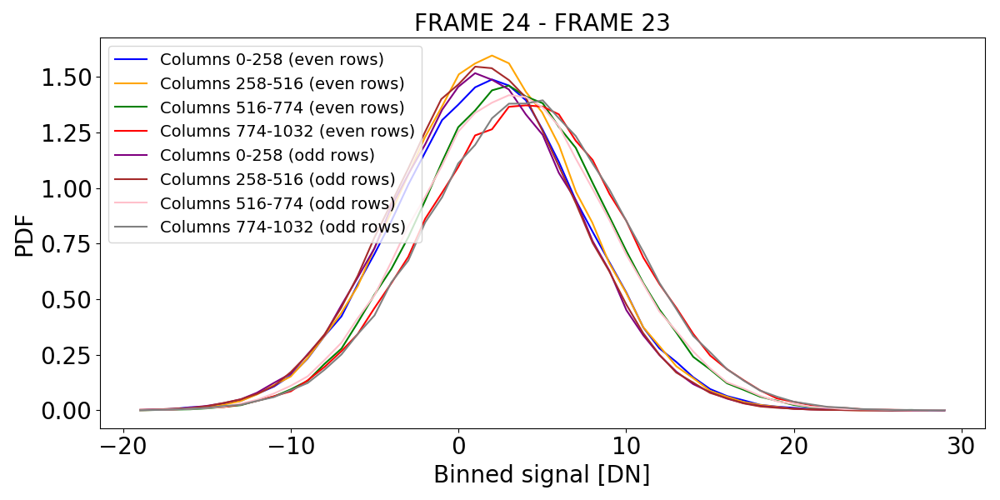

In [120]:
# frame difference images
img1 = bkg_exp_ramp_LW[24,:1024,:258]-bkg_exp_ramp_LW[23,:1024,:258]
img2 = bkg_exp_ramp_LW[24,:1024,258:516]-bkg_exp_ramp_LW[23,:1024,258:516]
img3 = bkg_exp_ramp_LW[24,:1024,516:774]-bkg_exp_ramp_LW[23,:1024,516:774]
img4 = bkg_exp_ramp_LW[24,:1024,774:]-bkg_exp_ramp_LW[23,:1024,774:]

# histogram limits
lower_lim = -20.
upper_lim = 30.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 24 - FRAME 23')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Columns 0-258 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Columns 258-516 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Columns 516-774 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Columns 774-1032 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Columns 0-258 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Columns 258-516 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Columns 516-774 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Columns 774-1032 (odd rows)')
plt.legend(loc='upper left')
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


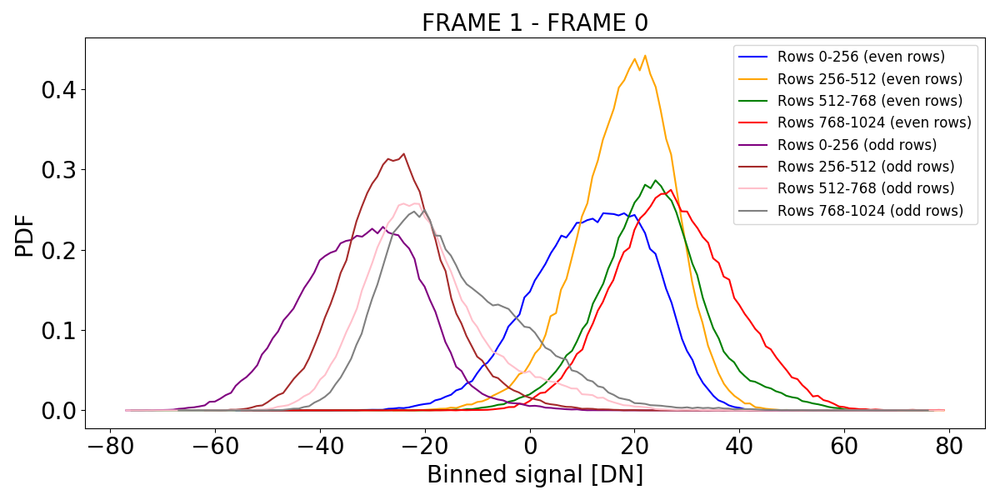

In [122]:
# frame difference images
img1 = bkg_exp_ramp_LW[1,:256,:]-bkg_exp_ramp_LW[0,:256,:]
img2 = bkg_exp_ramp_LW[1,256:512,:]-bkg_exp_ramp_LW[0,256:512,:]
img3 = bkg_exp_ramp_LW[1,512:768,:]-bkg_exp_ramp_LW[0,512:768,:]
img4 = bkg_exp_ramp_LW[1,768:1024,:]-bkg_exp_ramp_LW[0,768:1024,:]

# histogram limits
lower_lim = -80.
upper_lim = 80.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 1 - FRAME 0')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


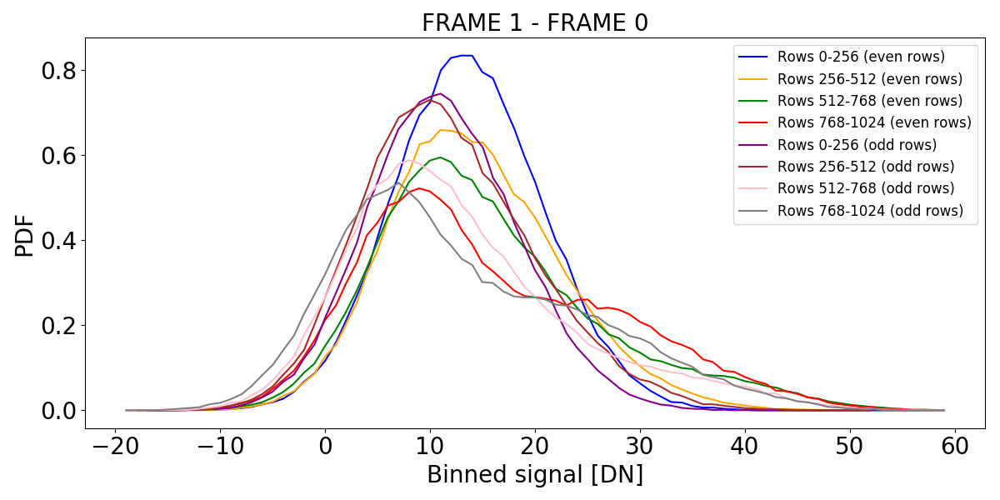

In [124]:
# frame difference images
img1 = bkg_exp_ramp_LW[2,:256,:]-bkg_exp_ramp_LW[1,:256,:]
img2 = bkg_exp_ramp_LW[2,256:512,:]-bkg_exp_ramp_LW[1,256:512,:]
img3 = bkg_exp_ramp_LW[2,512:768,:]-bkg_exp_ramp_LW[1,512:768,:]
img4 = bkg_exp_ramp_LW[2,768:1024,:]-bkg_exp_ramp_LW[1,768:1024,:]

# histogram limits
lower_lim = -20.
upper_lim = 60.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 2 - FRAME 1')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper right',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


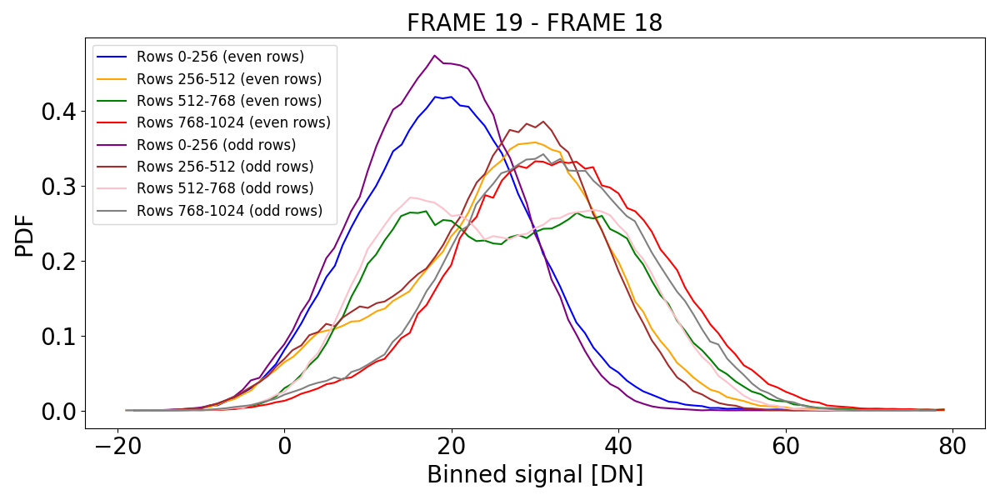

In [139]:
# frame difference images
img1 = bkg_exp_ramp_LW[19,:256,:]-bkg_exp_ramp_LW[18,:256,:]
img2 = bkg_exp_ramp_LW[19,256:512,:]-bkg_exp_ramp_LW[18,256:512,:]
img3 = bkg_exp_ramp_LW[19,512:768,:]-bkg_exp_ramp_LW[18,512:768,:]
img4 = bkg_exp_ramp_LW[19,768:1024,:]-bkg_exp_ramp_LW[18,768:1024,:]

# histogram limits
lower_lim = -20.
upper_lim = 80.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 19 - FRAME 18')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


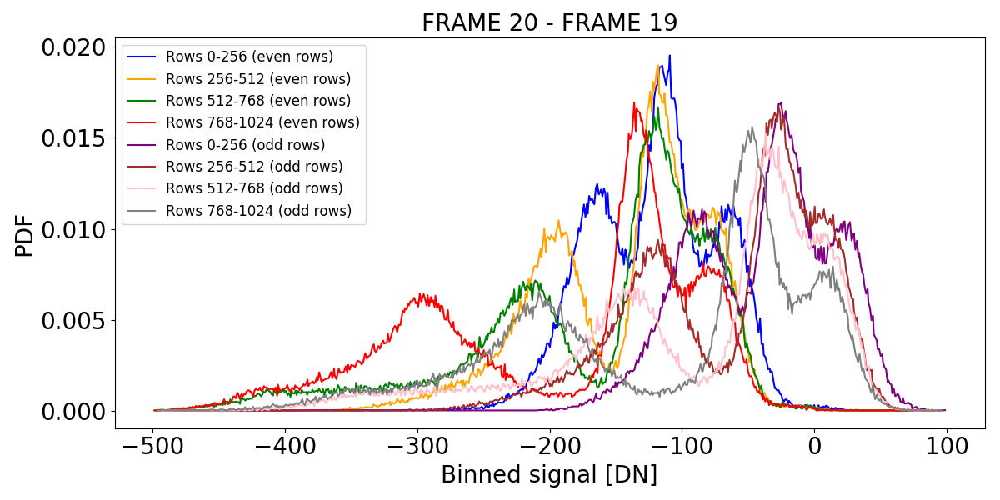

In [130]:
# frame difference images
img1 = bkg_exp_ramp_LW[20,:256,:]-bkg_exp_ramp_LW[19,:256,:]
img2 = bkg_exp_ramp_LW[20,256:512,:]-bkg_exp_ramp_LW[19,256:512,:]
img3 = bkg_exp_ramp_LW[20,512:768,:]-bkg_exp_ramp_LW[19,512:768,:]
img4 = bkg_exp_ramp_LW[20,768:1024,:]-bkg_exp_ramp_LW[19,768:1024,:]

# histogram limits
lower_lim = -500.
upper_lim = 100.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 20 - FRAME 19')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


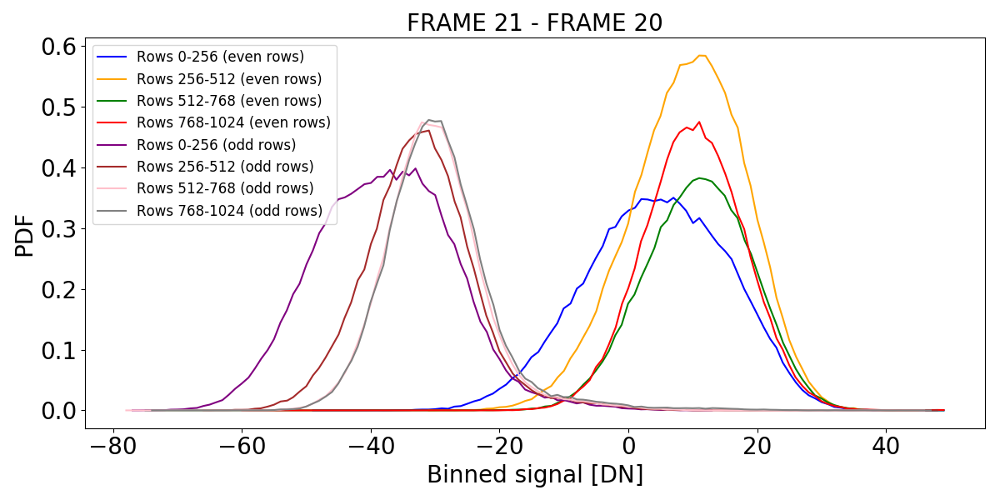

In [136]:
# frame difference images
img1 = bkg_exp_ramp_LW[21,:256,:]-bkg_exp_ramp_LW[20,:256,:]
img2 = bkg_exp_ramp_LW[21,256:512,:]-bkg_exp_ramp_LW[20,256:512,:]
img3 = bkg_exp_ramp_LW[21,512:768,:]-bkg_exp_ramp_LW[20,512:768,:]
img4 = bkg_exp_ramp_LW[21,768:1024,:]-bkg_exp_ramp_LW[20,768:1024,:]

# histogram limits
lower_lim = -80.
upper_lim = 50.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 21 - FRAME 20')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

<IPython.core.display.Javascript object>


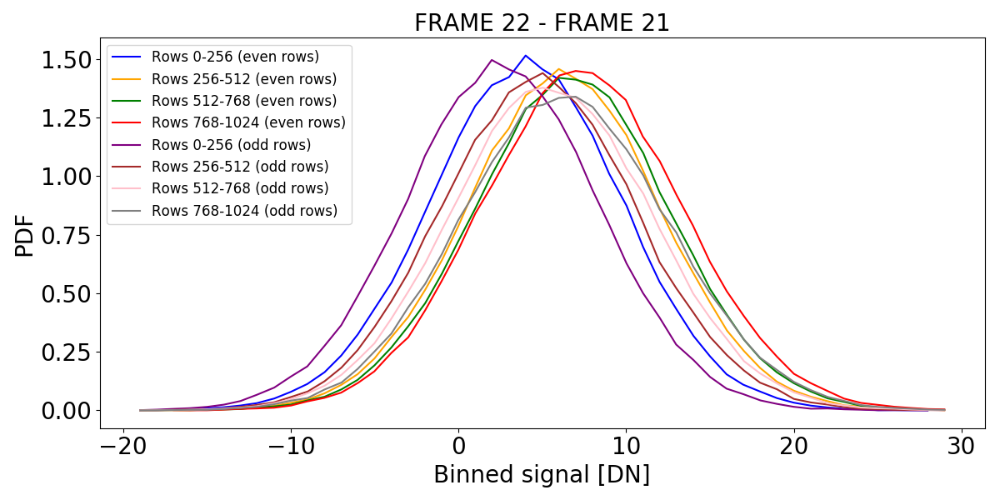

In [135]:
# frame difference images
img1 = bkg_exp_ramp_LW[22,:256,:]-bkg_exp_ramp_LW[21,:256,:]
img2 = bkg_exp_ramp_LW[22,256:512,:]-bkg_exp_ramp_LW[21,256:512,:]
img3 = bkg_exp_ramp_LW[22,512:768,:]-bkg_exp_ramp_LW[21,512:768,:]
img4 = bkg_exp_ramp_LW[22,768:1024,:]-bkg_exp_ramp_LW[21,768:1024,:]

# histogram limits
lower_lim = -20.
upper_lim = 30.

# compute histograms
arr1_even_hist,arr2_even_hist,arr3_even_hist,arr4_even_hist,arr1_even_bincenters,arr2_even_bincenters,arr3_even_bincenters,arr4_even_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='even')
arr1_odd_hist,arr2_odd_hist,arr3_odd_hist,arr4_odd_hist,arr1_odd_bincenters,arr2_odd_bincenters,arr3_odd_bincenters,arr4_odd_bincenters = plot_frame_difference_histogram(img1,img2,img3,img4,lower_lim,upper_lim,rows='odd')

# plot histograms
plt.close('all')
plt.figure(figsize=(12,6))
plt.title('FRAME 22 - FRAME 21')
plt.plot(arr1_even_bincenters[arr1_even_hist>0],arr1_even_hist[arr1_even_hist>0],'b',label='Rows 0-256 (even rows)')
plt.plot(arr2_even_bincenters[arr2_even_hist>0],arr2_even_hist[arr2_even_hist>0],'orange',label='Rows 256-512 (even rows)')
plt.plot(arr3_even_bincenters[arr3_even_hist>0],arr3_even_hist[arr3_even_hist>0],'g',label='Rows 512-768 (even rows)')
plt.plot(arr4_even_bincenters[arr4_even_hist>0],arr4_even_hist[arr4_even_hist>0],'r',label='Rows 768-1024 (even rows)')
plt.plot(arr1_odd_bincenters[arr1_odd_hist>0],arr1_odd_hist[arr1_odd_hist>0],'purple',label='Rows 0-256 (odd rows)')
plt.plot(arr2_odd_bincenters[arr2_odd_hist>0],arr2_odd_hist[arr2_odd_hist>0],'brown',label='Rows 256-512 (odd rows)')
plt.plot(arr3_odd_bincenters[arr3_odd_hist>0],arr3_odd_hist[arr3_odd_hist>0],'pink',label='Rows 512-768 (odd rows)')
plt.plot(arr4_odd_bincenters[arr4_odd_hist>0],arr4_odd_hist[arr4_odd_hist>0],'gray',label='Rows 768-1024 (odd rows)')
plt.legend(loc='upper left',fontsize=12)
plt.xlabel('Binned signal [DN]')
plt.ylabel('PDF')
plt.tight_layout()

# Summary of effects observed:
* Four pixel column systematic.
* Bright lines in first frame difference.
* First and last frame offsets.
* Decrease in slope between subsequent integrations.
* Fringes can be seen in the non-first, non-last frame difference plots.
* There are always two prominent features in the histograms of the frame difference images.
* Odd/Even row offsets are only apparent in the first and last frame difference plots (more so in the former compared to the latter).